# Front-prop: MNIST
Front-prop demo on MNIST.

Note this is still WIP - testing different hyperparameters etc.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from tqdm.autonotebook import tqdm

import fp_modules as fp
from utils.fp_utils import sphere_rnd_gen, shanon_entropy_binned, plot_matrix, draw_layer
from utils.fp_datasets import SimplePatterns
from utils.metrics_utils import *

/tmp/ipykernel_3671105/1129537871.py:5: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm


In [3]:
# If there's a GPU available...
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("Running on the GPU")
else:
    device = torch.device("cpu")
    print("Running on the CPU")



Running on the CPU


In [4]:
# Disable gradients in torch - Frontprop does not need them.
torch.set_grad_enabled(False)

In [5]:
np.set_printoptions(formatter={'float': lambda x: "{0:0.2f}".format(x)})


## Learn MNIST

Create a single **linear** layer of Frontprop and continously feed samples from MNIST train dataset (flattened to 1D), in random order.

In [6]:
import torchvision
import torchvision.datasets as datasets

mnist_trainset = datasets.MNIST(root='./data', train=True, download=True, transform=None)
mnist_train = mnist_trainset.data.to(device) # .cpu().detach().numpy()
mnist_train_labels = mnist_trainset.targets.to(device) # .cpu().detach().numpy()

mnist_testset = datasets.MNIST(root='./data', train=False, download=True, transform=None)
mnist_test = mnist_testset.data.to(device) # .cpu().detach().numpy()
mnist_test_labels = mnist_testset.targets.to(device) # .cpu().detach().numpy()

# normalise to 0-1
mnist_train = mnist_train / 256.0
mnist_test = mnist_test / 256.0

(mnist_train.shape, mnist_train_labels.shape, mnist_test.shape, mnist_test_labels.shape)

(torch.Size([60000, 28, 28]),
 torch.Size([60000]),
 torch.Size([10000, 28, 28]),
 torch.Size([10000]))

wandb: Currently logged in as: rohrl (rohrl-research). Use `wandb login --relogin` to force relogin
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.



----------------
Running frontprop on MNIST

 === Epoch #0 === 
Neurons' weights:


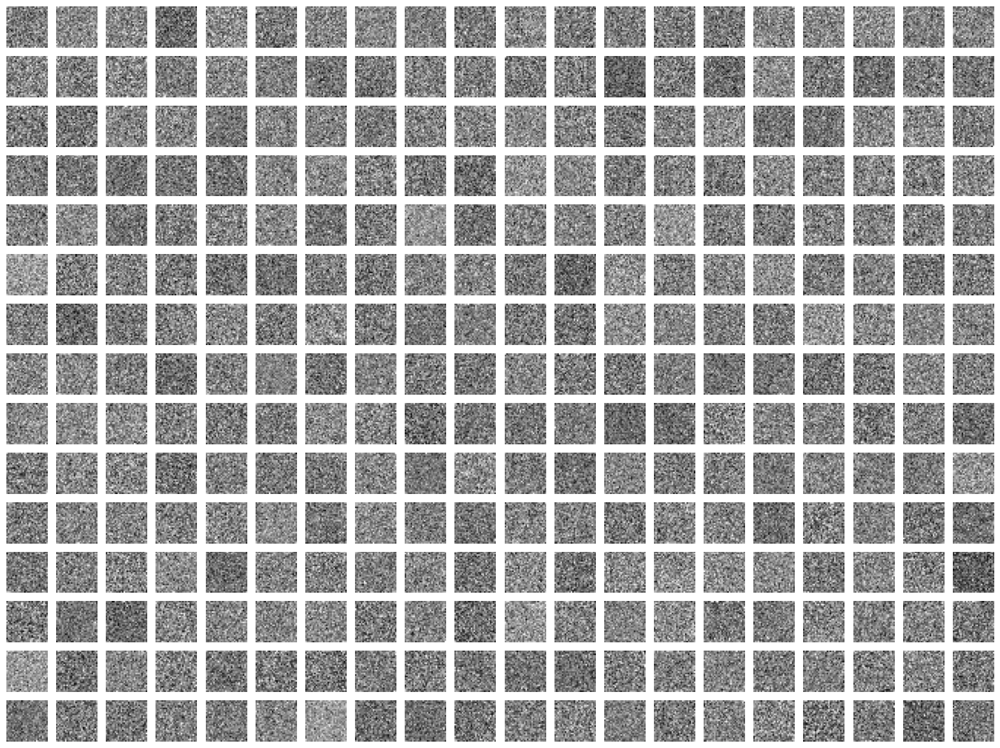

  0%|          | 0/60000 [00:00<?, ?it/s]

Neurons' weights:


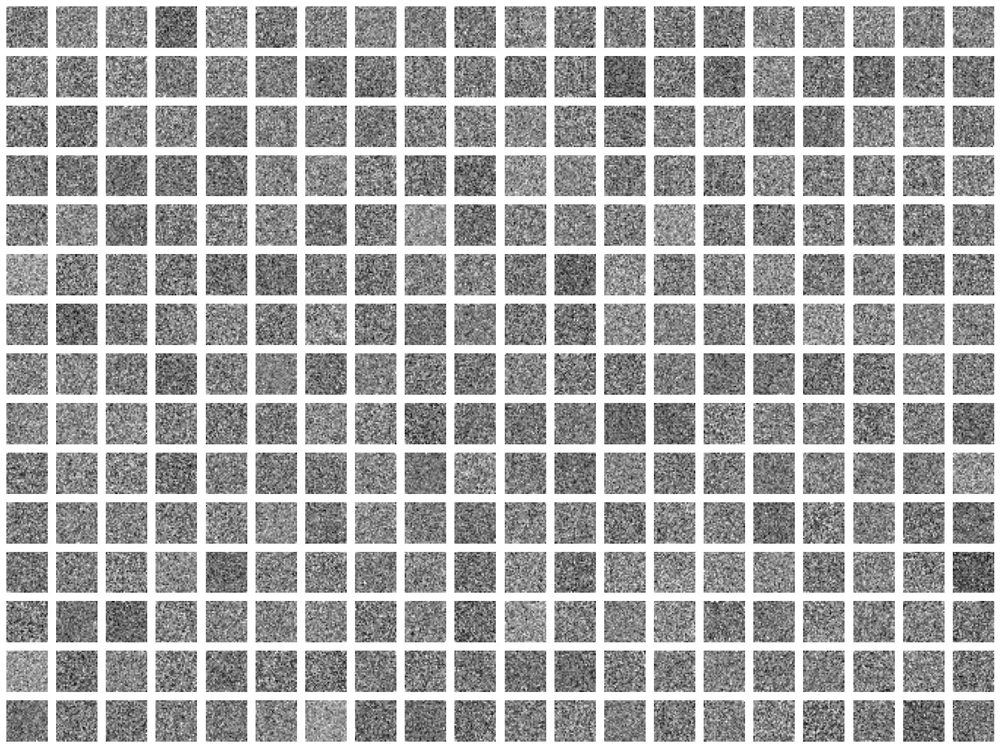

 33%|███▎      | 19951/60000 [00:44<00:58, 679.45it/s]

Neurons' weights:


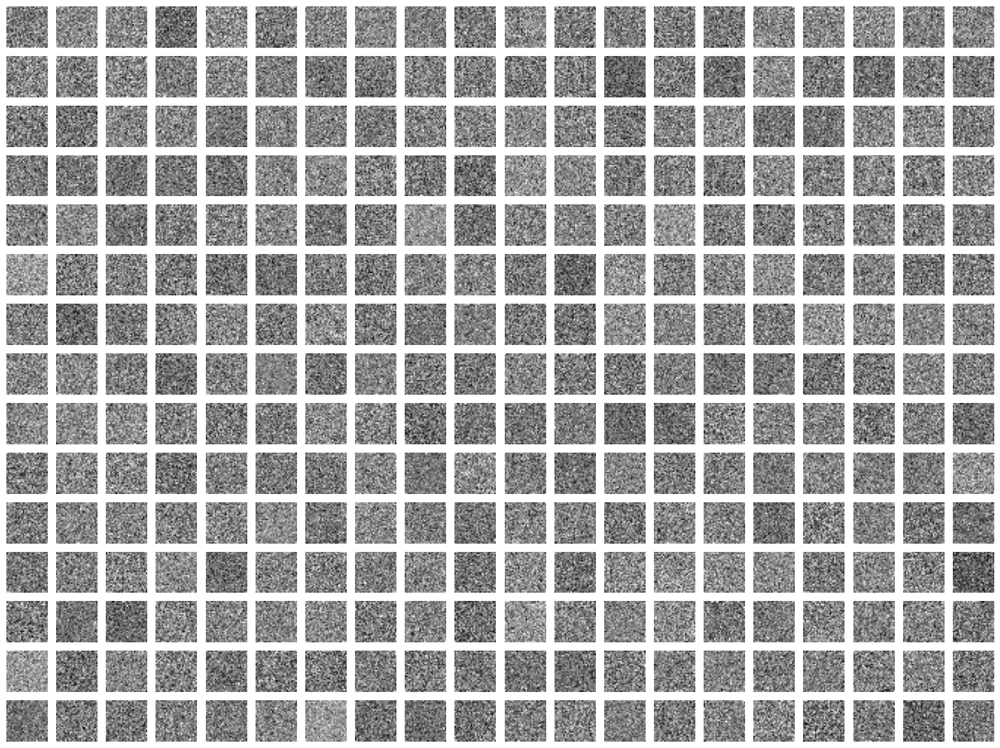

 67%|██████▋   | 39986/60000 [01:27<00:28, 701.31it/s]

Neurons' weights:


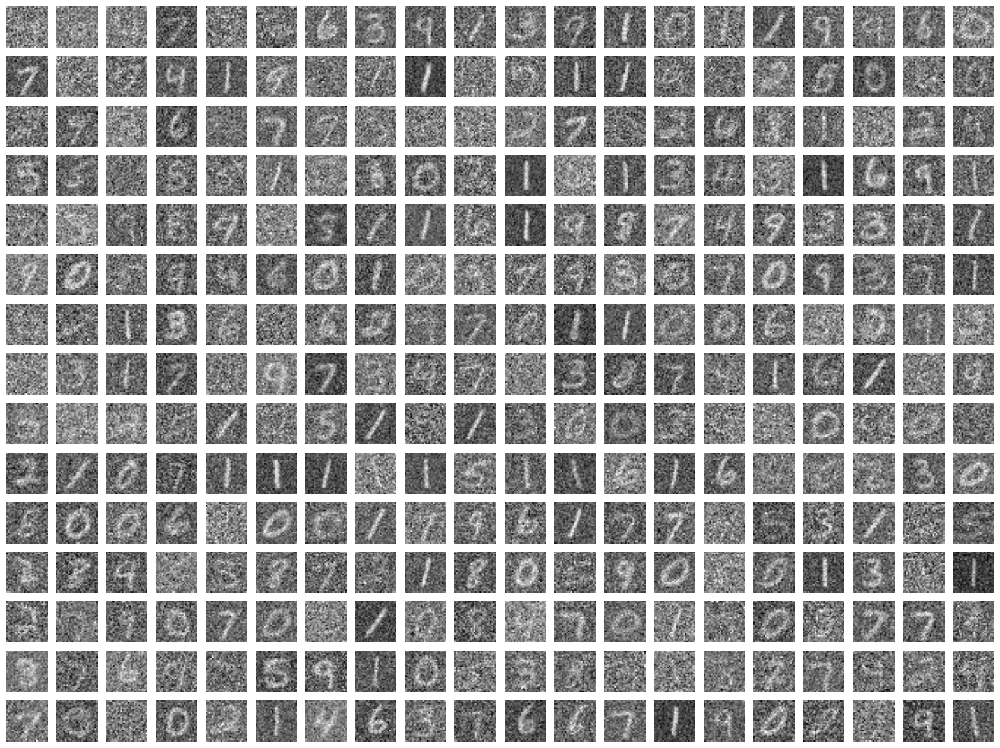

100%|██████████| 60000/60000 [02:10<00:00, 459.80it/s]



 === Final state === 
Neurons' weights:


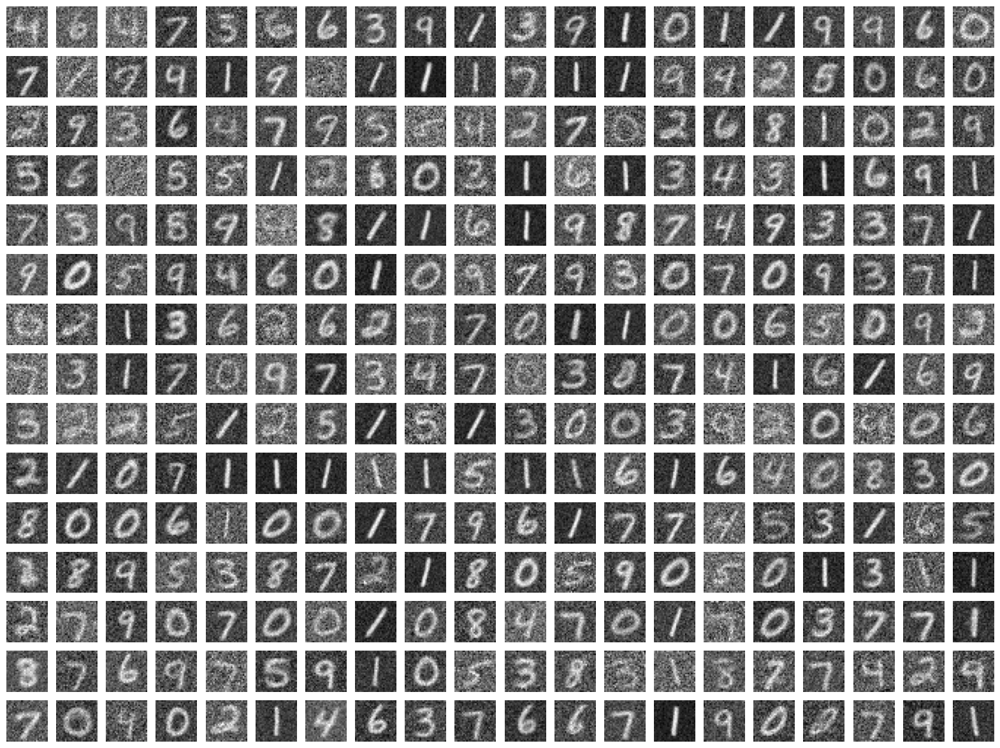

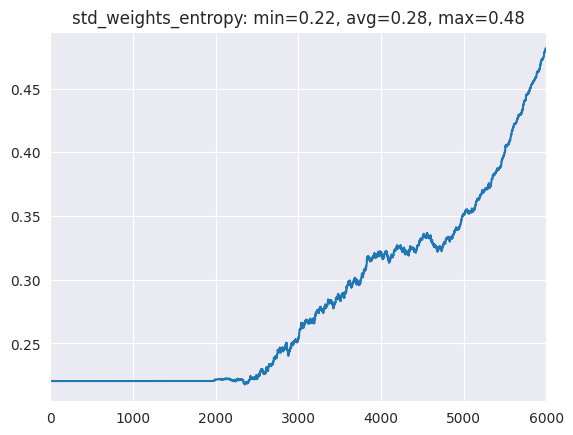

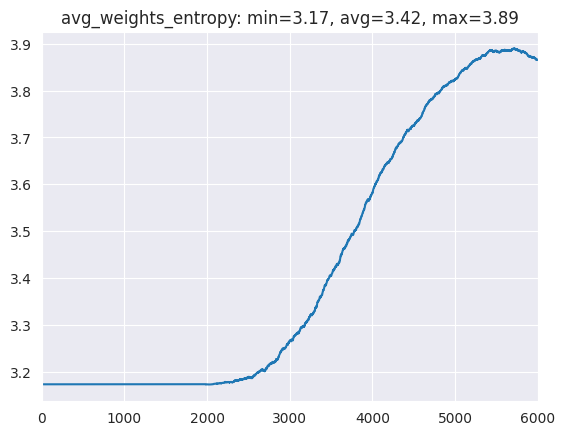

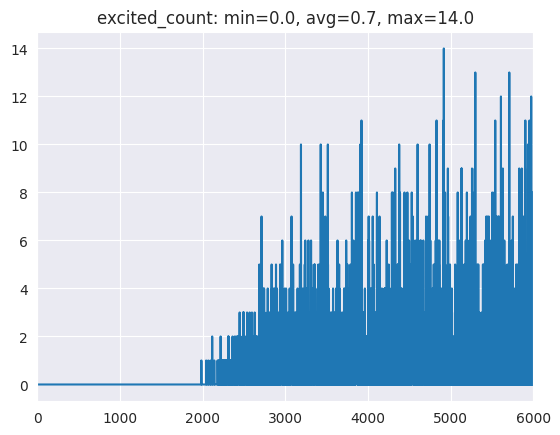

avg_weights_entropy,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▃▃▃▄▄▄▅▅▅▆▆▆▆▇▇███
excited_count,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▂▂▁▅▁▁▂▁▁▃▁▁▅▁▂▁▃▁█▃▁
std_weights_entropy,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▃▃▃▃▄▄▄▄▄▄▄▄▄▅▅▅▅▆▆▆▇▇▇█
avg_weights_entropy,3.86628
excited_count,2
std_weights_entropy,0.48094


In [7]:
EPOCHS = 1
NEURONS = 300
THRESHOLD_DECAY=0.0001
WEIGHT_BOOST=0.01

DIMS = [28, 28]
DRAW_INTERVAL = 20000
STATS_INTERVAL = DRAW_INTERVAL / 2000

init_wandb(w_boost=WEIGHT_BOOST,
           t_decay=THRESHOLD_DECAY,
           project="frontprop",
           dataset="mnist",
           iterations=EPOCHS,
           neurons=NEURONS)


layer = fp.FpLinear(DIMS[0]*DIMS[1], NEURONS, t_decay=THRESHOLD_DECAY, w_boost=WEIGHT_BOOST, device=device)
stats = TrailingStats()

print("\n----------------\nRunning frontprop on MNIST")

for epoch in range(EPOCHS):
    
    print(f"\n === Epoch #{epoch} === ")
    
    # draw_layer(layer, DIMS)
    
    indices = np.arange(mnist_train.shape[0])
    np.random.shuffle(indices)
    
    for i, input_idx in enumerate(tqdm(indices)):

        x = mnist_train[input_idx].flatten().unsqueeze(0)

        out1 = layer.forward(x)

        if i % DRAW_INTERVAL == 0:
            draw_layer(layer, DIMS)

        if i % STATS_INTERVAL == 0:
            ls = stats.add_from_layer(layer)
            log_metric(ls)

print(f"\n === Final state === ")
draw_layer(layer, DIMS)
stats.report()
close_wandb()


---

## Evaluate

Test the "goodness" of embeddings on the unseen MNIST test dataset.

#### Compute embeddings (network outputs) on test set

In [8]:
# first collect outputs for MNIST test samples

def compute_embeddings(layer, data):
    layer.freeze()
    # FIXME: this is inefficient, add mini-batch support when frozen
    embeddings = [layer.forward(sample.flatten().unsqueeze(0),
                                apply_threshold=False).squeeze() for sample in data]
    embeddings = torch.stack(embeddings)
    layer.unfreeze()
    return embeddings
    
def standard_scale(data):
    # standard scaling (0 mean, 1 variance) before we feed into PCA or LogReg
    mean = torch.mean(data)
    std = torch.std(data)
    return (data - mean) / std


In [10]:
mnist_train_embeddings = standard_scale(compute_embeddings(layer, mnist_train))
print(mnist_train_embeddings.shape)
      
mnist_test_embeddings = standard_scale(compute_embeddings(layer, mnist_test))
print(mnist_test_embeddings.shape)


torch.Size([60000, 300])
torch.Size([10000, 300])


### PCA

Use PCA to visualise whether the network outputs cluster well.

In [11]:
def show_pca(data, labels, alpha=0.3, s=15):
    from sklearn.decomposition import PCA

    data = data.cpu().numpy()
    labels = labels.cpu().numpy()

    pca = PCA(n_components=2)
    pca_features = pca.fit_transform(data)
    # plot:
    plt.figure(figsize=(15,10))
    plt.scatter(pca_features[:, 0], pca_features[:, 1],
                c=labels, edgecolor='none', alpha=alpha,
                cmap=plt.cm.get_cmap('tab10', 10), s=s)
    plt.colorbar()
    plt.show()

/tmp/ipykernel_3671105/1433430267.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=plt.cm.get_cmap('tab10', 10), s=s)


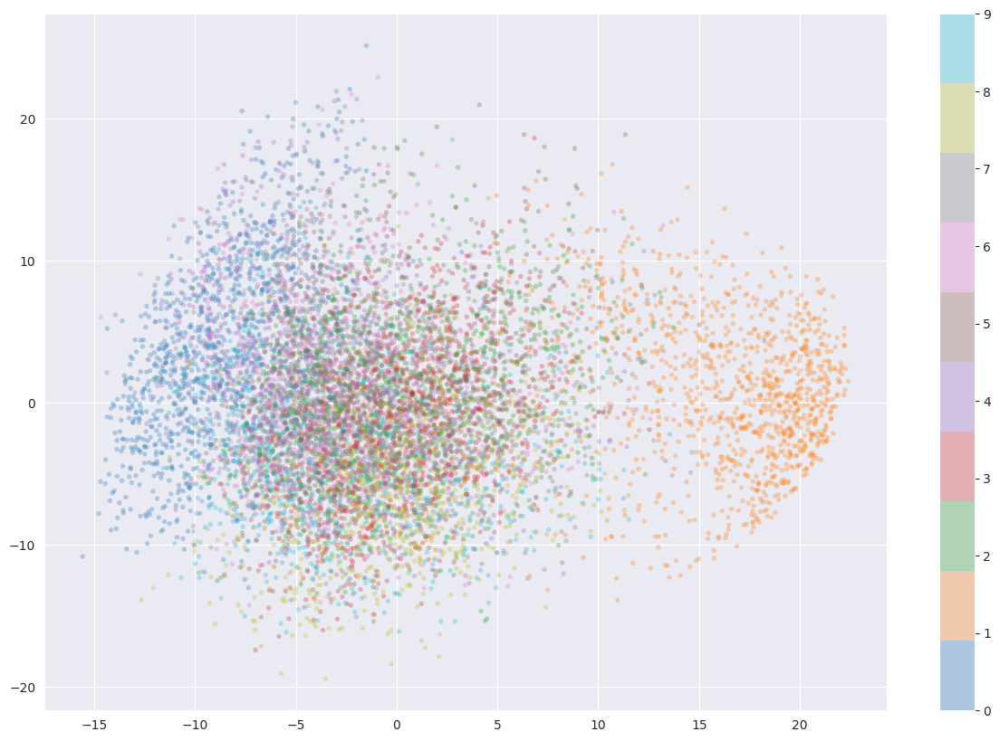

In [12]:

show_pca(mnist_test_embeddings, mnist_test_labels)

One of previous best examples:

C:\Users\karol\AppData\Local\Temp\ipykernel_1756\3866844731.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=plt.cm.get_cmap('tab10', 10), s=s)


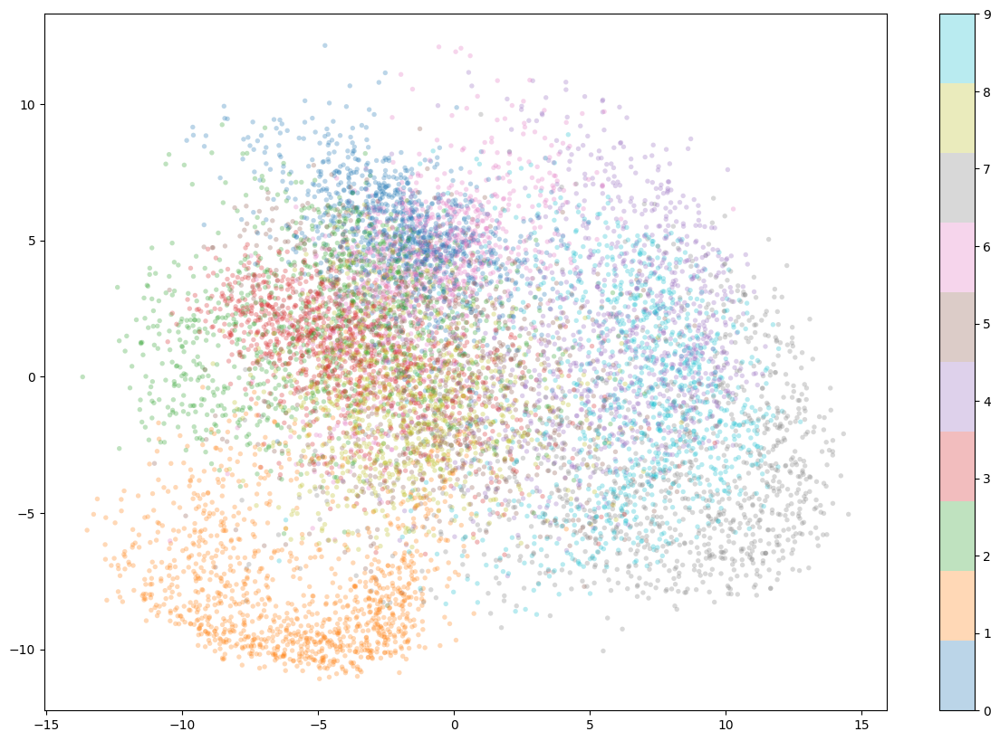

In [51]:

show_pca(mnist_test_embeddings, mnist_test_labels)

### Log Reg probe

This is similar to the benchmark used in Geoffrey Hinton's paper ("forward-forward", see [here](https://www.cs.toronto.edu/~hinton/FFA13.pdf)).
Use outputs as embeddings and train a simple multi-class Log Reg (aka Softmax) on them.

Results can then be compared with other self-supervised networks, incl the "forward-forward" above.

In [13]:
def logReg_score(train_data, train_labels, test_data, test_labels, max_iter=10000, verbose=0):
    from sklearn.linear_model import LogisticRegression, LogisticRegressionCV

    train_data = train_data.cpu().numpy()
    train_labels = train_labels.cpu().numpy()
    test_data = test_data.cpu().numpy()
    test_labels = test_labels.cpu().numpy()

    # TODO: find optimal hyper params - try out different solvers etc
    # TODO: try LogisticRegressionCV
    logReg = LogisticRegression(verbose=verbose, solver = 'lbfgs', multi_class="multinomial", max_iter=max_iter, n_jobs = -1)
    logReg.fit(train_data, train_labels)
    score = logReg.score(test_data, test_labels)
    return score


In [14]:
score = logReg_score(mnist_train_embeddings, mnist_train_labels, mnist_test_embeddings, mnist_test_labels)
score

0.9228

In [ ]:
# layer.save(f"mnist_{layer1.output_size}n_{EPOCHS}ep_{layer1.w_boost}wb_{layer1.t_decay}td_{round(score,4)}score")

## Scoreboard

1. `0.9655` - 2000/100/500 neurons, 1 epoch, td = 0.0001, wb = 0.01 (vs untrained `?`)
1. `0.9614` - 2000 neurons, 1 epoch, td = 0.0001, wb = 0.01 (vs untrained `?`)
1. `0.9553` - 2000 neurons, 3 epochs, td = 0.0001, wb = 0.01 (vs untrained `?`)
1. `0.9540` - 1000 neurons, 1 epoch, td = 0.0001, wb = 0.01 (vs untrained `0.9469`)
1. `0.9494` - 500  neurons, 1 epoch, td = 0.0001, wb = 0.01 (vs untrained `0.9314`)
1. `0.9318` - 200  neurons, 1 epoch, td = 0.0001, wb = 0.01 (vs untrained `0.9167`)
1. `0.9166` - 100  neurons, 1 epoch, td = 0.0001, wb = 0.01 (vs untrained `0.8927`)
1. `0.7898` - 20   neurons, 1 epoch, td = 0.0001, wb = 0.01 (vs untrained `0.6694`)

## Baselines
Compare the above accuracy with some baselines to relate the performance.
Proposed baselines:
1. An untrained network with randomly initialised weights (kernels). This tests whether training the network improves accuracy.
1. LogReg probe on raw MNIST data, without the network. This tests whether the network generated representation is better than the original features (ie whether the network learned any useful representation of patterns in the data).

### Random weights

Freezing all 100 neurons
Neurons' weights:


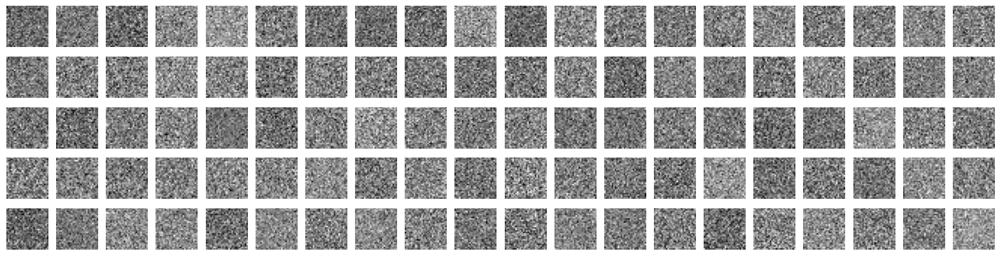

In [32]:
# first collect outputs for all MNIST samples

untrained_layer = FastLayer(DIMS[0]*DIMS[1], NEURONS)
untrained_layer.freeze()
untrained_layer.draw(DIMS)

untrained_embeddings = standard_scale(compute_embeddings(untrained_layer, mnist_train))
untrained_test_embeddings = standard_scale(compute_embeddings(untrained_layer, mnist_test))


In [36]:
untrained_logReg = logReg_score(untrained_embeddings, mnist_train_labels, 
                                untrained_test_embeddings, mnist_test_labels)
untrained_logReg

0.8955

In [35]:
print(untrained_logReg)

0.8955


### Only LogReg
Plain Log Reg, without the network, directly on MNIST features.
Typical accuracy ~0.92-0.93

In [296]:

# flatten 2D images to continous vectors
mnist_train_1d = np.reshape(mnist_train, newshape=(mnist_train.shape[0], mnist_train.shape[1]**2))
mnist_test_1d = np.reshape(mnist_test, newshape=(mnist_test.shape[0], mnist_test.shape[1]**2))

# standard preprocessing (0 mean, 1 variance) before we feed into LogReg 
mnist_train_scaled = preprocessing.StandardScaler().fit_transform(mnist_train_1d)
mnist_test_scaled = preprocessing.StandardScaler().fit_transform(mnist_test_1d)


In [297]:
raw_logreg_score = logReg_score(mnist_train_1d, mnist_train_labels,
                                raw_logReg.score(mnist_test_1d, mnist_test_labels)
raw_logreg_score

0.9257

In [298]:
print(raw_logreg_score)

0.9257


### KMeans + KNN

TODO:
Cluster output embeddings using KMeans then run KNN to classify

---

## Compare to standard CNN on backprop
Visualise kernels in a typical CNN network.

In [48]:
from torch import nn, optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Define a transform to normalize the data
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize((0.5,), (0.5,))])

trainset = datasets.MNIST(root='./data', download=True, train=True, transform=transform)

In [62]:
trainloader = DataLoader(trainset, batch_size=32, shuffle=True)

model = nn.Sequential(
    # nn.Linear(784, 50), #, bias=False),

    nn.Conv2d(1, 10, kernel_size=5),
    nn.MaxPool2d(2),

    nn.ReLU(),
    nn.Flatten(),

    nn.Linear(1440, 10), #, bias=False),
    nn.Softmax(dim=1))

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.01)

epochs = 5
for e in range(epochs):
    running_loss = 0
    for images, labels in trainloader:

        # For Linear:
        # Flatten MNIST images into a 784 long vector
        # images = images.view(images.shape[0], -1)

        # For Conv:
        # Add an extra dimension for the channel
        # images = images.unsqueeze(1)

        # Training pass
        optimizer.zero_grad()

        output = model(images)
        loss = criterion(output, labels)

        # Backpropagation
        loss.backward()

        # Weight update
        optimizer.step()

        running_loss += loss.item()
    else:
        print(f"Training loss: {running_loss/len(trainloader)}")

In [66]:
# Download and load the test data
testset = datasets.MNIST('../data', download=True, train=False, transform=transform)
testloader = DataLoader(testset, batch_size=64, shuffle=True)

correct_count, all_count = 0, 0
for images,labels in testloader:
    for i in range(len(labels)):

        img = images[i].unsqueeze(1) # .view(1, 784)

        with torch.no_grad():
                ps = model(img)

        probab = list(ps.numpy()[0])
        pred_label = probab.index(max(probab))
        true_label = labels.numpy()[i]
        if(true_label == pred_label):
            correct_count += 1
        all_count += 1

print("Number Of Images Tested =", all_count)
print("\nModel Accuracy =", (correct_count/all_count))

Number Of Images Tested = 10000

Model Accuracy = 0.7764


In [73]:

weight_matrices = [model[0].weight.data[i].squeeze() for i in range(len(model[0].weight.data))]

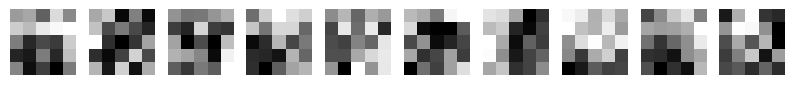

In [74]:
plot_matrix([5,5], *weight_matrices)

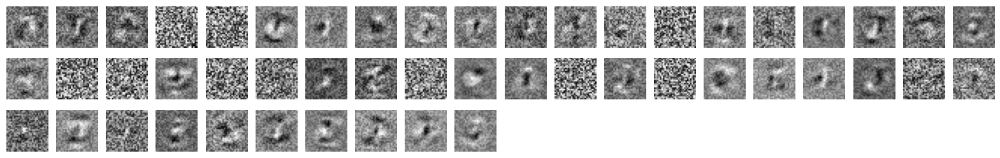

In [56]:
plot_matrix([28,28], *weight_matrices)

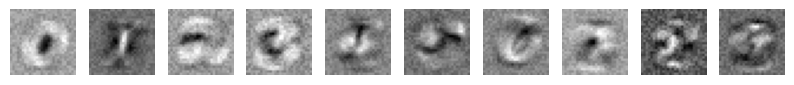

In [25]:
plot_matrix([28,28], *weight_matrices)